<a href="https://colab.research.google.com/github/FlorPrandi/nuclio-git-course/blob/main/Tree_EasyMoney.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
# Aquí iria el codigo para conectarse a Google Drive
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
import numpy as np
import pandas as pd
import seaborn as sns
# Importing
import sklearn
from sklearn.datasets import load_boston
from sklearn.preprocessing import StandardScaler, MinMaxScaler
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt

In [ ]:
ruta = '/content/drive/MyDrive/Nuclio/Capstone'

In [ ]:
df = pd.read_pickle( ruta + '/' + 'final_df1')

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 4841417 entries, 0 to 4841416
Data columns (total 78 columns):
 #   Column                             Dtype         
---  ------                             -----         
 0   pk_cid                             int64         
 1   pk_partition                       datetime64[ns]
 2   short_term_deposit                 category      
 3   loans                              category      
 4   mortgage                           category      
 5   funds                              category      
 6   securities                         category      
 7   long_term_deposit                  category      
 8   em_account_pp                      category      
 9   credit_card                        category      
 10  payroll                            category      
 11  pension_plan                       category      
 12  payroll_account                    category      
 13  emc_account                        category      
 14  de

In [ ]:
lista_servicios = ['em_account_pp',
        'payroll_account',
       'emc_account', 'debit_card', 'em_account_p', 'em_acount']

lista_ahorro_inv = ['short_term_deposit',
       'funds', 'securities', 'long_term_deposit', 'pension_plan']

lista_fincanciacion = [ 'loans', 'mortgage','credit_card' ]

In [ ]:
productos = df.columns

In [ ]:
for col in productos:
  if col in  lista_servicios or col in lista_ahorro_inv or col in lista_fincanciacion:
    df.drop(col,axis = 1, inplace= True)
    df.drop('dif_' + col, axis=1, inplace= True)
    df.drop(col + '_previous_month',axis = 1, inplace= True)
    df.drop('revenue_' + col, axis=1, inplace= True)

In [ ]:
df.columns

Index(['pk_cid', 'pk_partition', 'payroll', 'total_revenue', 'total_productos',
       'total_servicios', 'total_ahorro_inv', 'total_fincanciacion',
       'entry_date', 'entry_channel', 'active_customer', 'segment',
       'country_id', 'region_code', 'age', 'salary', 'Population_region',
       'Region_name', 'Population_country', 'Population_Roc', 'deseased',
       'gender_H'],
      dtype='object')

In [ ]:
df.drop('payroll',axis = 1, inplace= True)

In [ ]:
df.drop(['total_revenue','total_productos','total_servicios','total_ahorro_inv'],axis = 1, inplace= True)

In [ ]:
df.drop(['Population_Roc','region_code','Region_name'],axis = 1, inplace= True)

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 4841417 entries, 0 to 4841416
Data columns (total 14 columns):
 #   Column               Dtype         
---  ------               -----         
 0   pk_cid               int64         
 1   pk_partition         datetime64[ns]
 2   total_fincanciacion  category      
 3   entry_date           datetime64[ns]
 4   entry_channel        object        
 5   active_customer      category      
 6   segment              object        
 7   country_id           category      
 8   age                  uint8         
 9   salary               float64       
 10  Population_region    int64         
 11  Population_country   int64         
 12  deseased             category      
 13  gender_H             category      
dtypes: category(5), datetime64[ns](2), float64(1), int64(3), object(2), uint8(1)
memory usage: 360.1+ MB


In [ ]:
#Genero una nueva variable con la columna tiene_financiacion que es el target
TARGET = 'tiene_financiacion'

In [ ]:
df['tiene_financiacion'] = (df['total_fincanciacion'].astype('int') > 0)*1

In [ ]:
df.drop('total_fincanciacion',axis = 1, inplace= True)

In [ ]:
df

,pk_cid,pk_partition,entry_date,entry_channel,active_customer,segment,country_id,age,salary,Population_region,Population_country,deseased,gender_H,tiene_financiacion
0,15891,2018-07-28,2018-07-28,KAT,1.0,03 - UNIVERSITARIO,ES,59,88654.65,6751251,46754778,0,1,0
1,16203,2019-01-28,2018-12-23,KAT,1.0,02 - PARTICULARES,ES,70,88654.65,5714730,46754778,0,0,0
2,16203,2019-02-28,2018-12-23,KAT,1.0,01 - TOP,ES,70,88654.65,5714730,46754778,0,0,0
3,16203,2019-03-28,2018-12-23,KAT,1.0,01 - TOP,ES,70,88654.65,5714730,46754778,0,0,0
4,16203,2019-04-28,2018-12-23,KAT,1.0,01 - TOP,ES,70,88654.65,5714730,46754778,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4841412,1553456,2019-05-28,2019-05-30,KHE,1.0,03 - UNIVERSITARIO,ES,32,88654.65,6751251,46754778,0,1,0
4841413,1553541,2019-05-28,2019-05-31,KHE,1.0,03 - UNIVERSITARIO,ES,54,88654.65,168725,46754778,0,0,0
4841414,1553559,2019-05-28,2019-05-31,KHE,1.0,03 - UNIVERSITARIO,ES,43,88654.65,5714730,46754778,0,1,0
4841415,1553565,2019-05-28,2019-05-31,KHE,0.0,03 - UNIVERSITARIO,ES,68,88654.65,709403,46754778,0,1,0



- armar id unico pkcid+pk partition
- analizar relación con target para ver si hay que eliminar una mas
- transformar variables a numéricas (OHE y eso)
- codear el modelo

In [ ]:
#Generamos variables de fechas para el entry date
df['client_since'] = df['pk_partition'].max() - df['entry_date']

In [ ]:
#Generamos variables de las fechas de pk_partition
df['Season'] = df['pk_partition'].dt.quarter
df['Year'] = df['pk_partition'].dt.year
df['Month'] = df['pk_partition'].dt.month
df['Week'] = df['pk_partition'].dt.week
df['Weekday'] = df['pk_partition'].dt.weekday

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:5: FutureWarning: Series.dt.weekofyear and Series.dt.week have been deprecated.  Please use Series.dt.isocalendar().week instead.
  """


In [ ]:
df["client_since"] = df["client_since"].dt.days

In [ ]:
# HAY QUE RELLENAR VALORES NEGATIVOS DE CLIENT SINCE 
#for i in df['entry_date']:
#  if df['client_since'].astype(int) < 0:
#    df['entry_date'] = df['pk_partition']

In [ ]:
df['pk_unico'] = (df['pk_cid'].astype('str').str.pad(width=7,side='right', fillchar='0') + df['pk_partition'].astype('str').str.replace('-','') ).astype('int')

In [ ]:
df.set_index('pk_unico',drop=True, inplace=True)

In [ ]:
df.drop(['pk_partition','entry_date'],inplace=True, axis=1)

In [ ]:
df.drop(['pk_cid'],inplace=True, axis=1)

In [ ]:
df

,entry_channel,active_customer,segment,country_id,age,salary,Population_region,Population_country,deseased,gender_H,tiene_financiacion,client_since,Season,Year,Month,Week,Weekday
pk_unico,,,,,,,,,,,,,,,,,
158910020180728,KAT,1.0,03 - UNIVERSITARIO,ES,59,88654.65,6751251,46754778,0,1,0,304,3,2018,7,30,5
162030020190128,KAT,1.0,02 - PARTICULARES,ES,70,88654.65,5714730,46754778,0,0,0,156,1,2019,1,5,0
162030020190228,KAT,1.0,01 - TOP,ES,70,88654.65,5714730,46754778,0,0,0,156,1,2019,2,9,3
162030020190328,KAT,1.0,01 - TOP,ES,70,88654.65,5714730,46754778,0,0,0,156,1,2019,3,13,3
162030020190428,KAT,1.0,01 - TOP,ES,70,88654.65,5714730,46754778,0,0,0,156,2,2019,4,17,6
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
155345620190528,KHE,1.0,03 - UNIVERSITARIO,ES,32,88654.65,6751251,46754778,0,1,0,-2,2,2019,5,22,1
155354120190528,KHE,1.0,03 - UNIVERSITARIO,ES,54,88654.65,168725,46754778,0,0,0,-3,2,2019,5,22,1
155355920190528,KHE,1.0,03 - UNIVERSITARIO,ES,43,88654.65,5714730,46754778,0,1,0,-3,2,2019,5,22,1


In [ ]:
df[df['client_since'] <0]['client_since']

pk_unico
411946020190528   -2
155318020190528   -1
155318120190528   -1
155318820190528   -1
155321820190528   -1
155323220190528   -1
155324120190528   -1
155325320190528   -1
155325720190528   -1
155326620190528   -2
155327320190528   -2
155328820190528   -2
155329620190528   -2
155330320190528   -2
155333820190528   -2
155338920190528   -2
155339020190528   -2
155339320190528   -2
155341520190528   -2
155342920190528   -2
155343620190528   -2
155345620190528   -2
155354120190528   -3
155355920190528   -3
155356520190528   -3
155357120190528   -3
Name: client_since, dtype: int64

In [ ]:
df.loc[df['client_since'] <0,'client_since'] = 0

In [ ]:
df['tiene_financiacion'].value_counts()

0    4770104
1      71313
Name: tiene_financiacion, dtype: int64

In [ ]:
df.head()

,entry_channel,active_customer,segment,country_id,age,salary,Population_region,Population_country,deseased,gender_H,tiene_financiacion,client_since,Season,Year,Month,Week,Weekday
pk_unico,,,,,,,,,,,,,,,,,
158910020180728,KAT,1.0,03 - UNIVERSITARIO,ES,59,88654.65,6751251,46754778,0,1,0,304,3,2018,7,30,5
162030020190128,KAT,1.0,02 - PARTICULARES,ES,70,88654.65,5714730,46754778,0,0,0,156,1,2019,1,5,0
162030020190228,KAT,1.0,01 - TOP,ES,70,88654.65,5714730,46754778,0,0,0,156,1,2019,2,9,3
162030020190328,KAT,1.0,01 - TOP,ES,70,88654.65,5714730,46754778,0,0,0,156,1,2019,3,13,3
162030020190428,KAT,1.0,01 - TOP,ES,70,88654.65,5714730,46754778,0,0,0,156,2,2019,4,17,6


In [ ]:
df.to_pickle(ruta + '/' + r'df_sociodemographic', compression='infer', protocol=4, storage_options=None)

### Se eliminan las variables innecesarios y de baja varianza

In [ ]:
df.drop('country_id', inplace=True, axis=1)
df.drop('Population_country', inplace=True, axis=1)
#(discutir) se podría eliminar deseased ya que tiene muy baja variacion
#df.drop('deseased', inplace=True, axis=1)

In [ ]:
df[df[TARGET]==1]['deseased'].value_counts()

0    71303
1       10
Name: deseased, dtype: int64

# Graficos

In [ ]:
df_target = df[df[TARGET]==1]

In [ ]:
#df_month = pd.to_datetime(df_target['entry_date']).dt.year.astype('str') + '-' + pd.to_datetime(df_target['entry_date']).dt.month.astype('str').str.zfill(2)

In [ ]:
df.shape

(4841417, 15)

In [ ]:
#df_target['entry_date_month'] = df_month.to_frame

In [ ]:
#automatizamos el proceso de ploteo para todas las categóricas
def plot_cat_values(dataframe, column):
  plt.figure(figsize = (15,5))
  plt.xticks(rotation = 90)
  ax1 = plt.subplot(2,1,1) # 2 filas, 1 columna, posicion 1
  ax1 = sns.countplot(dataframe[column], order = list(dataframe[column].unique()) )
  ax2 = plt.subplot(2,1,2)
  ax2 = sns.countplot(data = dataframe, x= column, hue = TARGET)
  plt.show()

In [ ]:
#plot_cat_values(df,'pk_partition')

In [ ]:
#col = 'pk_partition'
#plt.figure(figsize = (60,5))
#plt.title(col)
#sns.countplot(data=df_target,x=col)

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


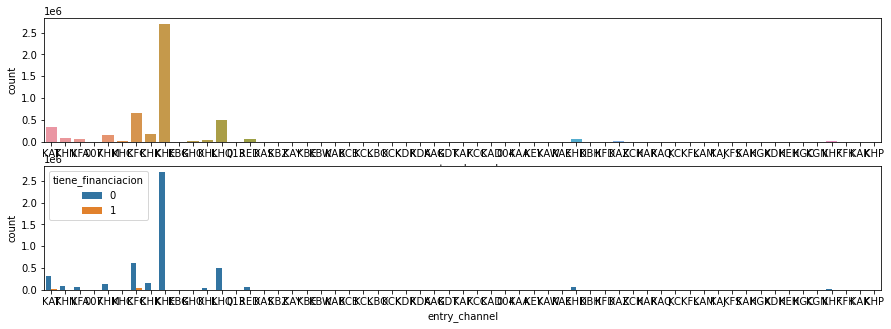

In [ ]:
plot_cat_values(df,'entry_channel')

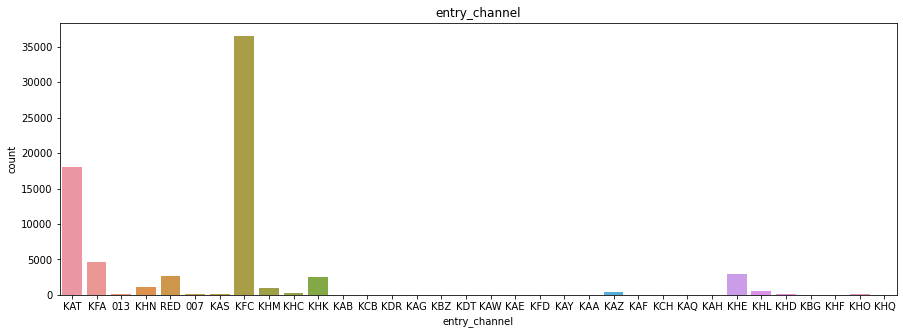

In [ ]:
col = 'entry_channel'
plt.figure(figsize = (15,5))
plt.title(col)
sns.countplot(data=df_target,x=col)

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning
/usr/local/lib/python3.7/dist-packages/pandas/io/formats/format.py:1429: FutureWarning: Index.ravel returning ndarray is deprecated; in a future version this will return a view on self.
  for val, m in zip(values.ravel(), mask.ravel())
/usr/local/lib/python3.7/dist-packages/pandas/io/formats/format.py:1429: FutureWarning: Index.ravel returning ndarray is deprecated; in a future version this will return a view on self.
  for val, m in zip(values.ravel(), mask.ravel())


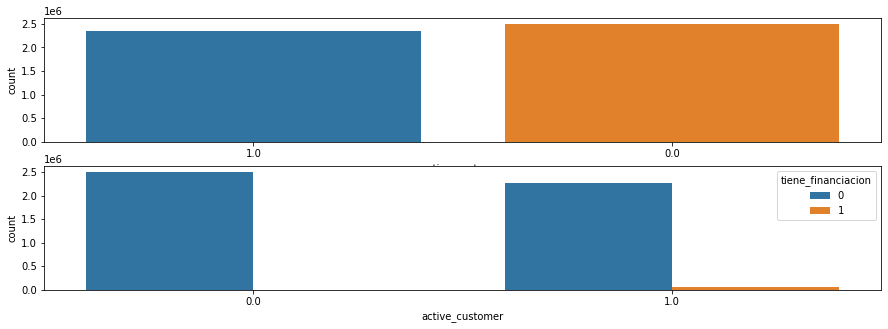

In [ ]:
plot_cat_values(df,'active_customer')

/usr/local/lib/python3.7/dist-packages/pandas/io/formats/format.py:1429: FutureWarning: Index.ravel returning ndarray is deprecated; in a future version this will return a view on self.
  for val, m in zip(values.ravel(), mask.ravel())


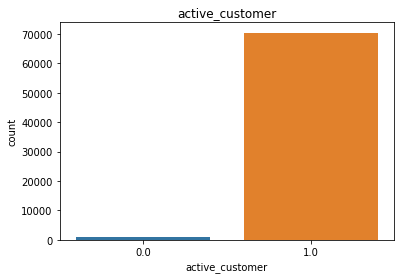

In [ ]:
col = 'active_customer'
plt.title(col)
sns.countplot(data=df_target,x=col)

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


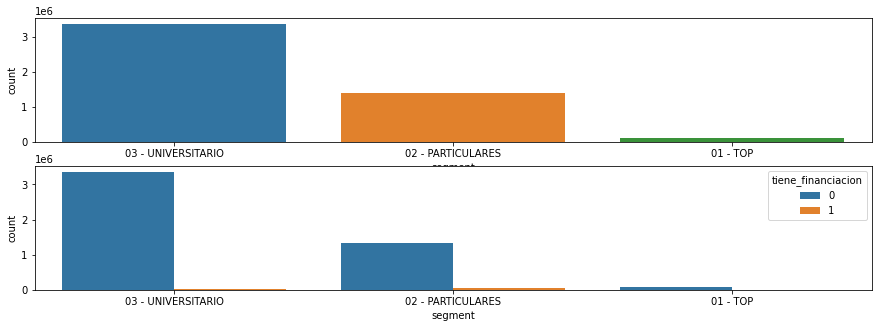

In [ ]:
plot_cat_values(df,'segment')

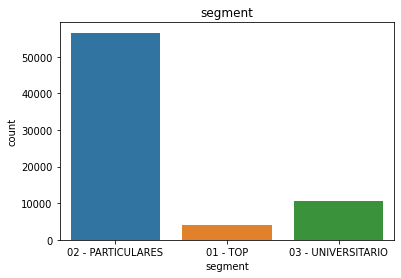

In [ ]:
col = 'segment'
plt.title(col)
sns.countplot(data=df_target,x=col)

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


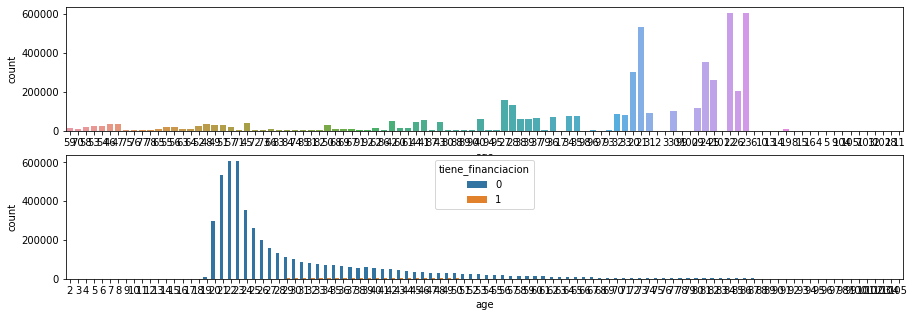

In [ ]:
plot_cat_values(df,'age')

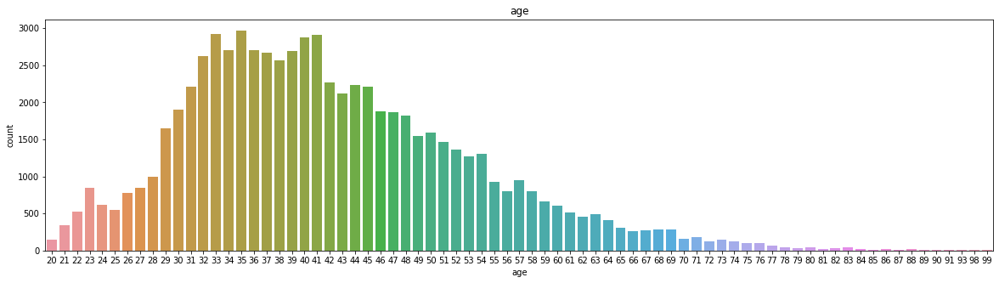

In [ ]:
col = 'age'
plt.figure(figsize = (20,5))
plt.title(col)
sns.countplot(data=df_target,x=col)

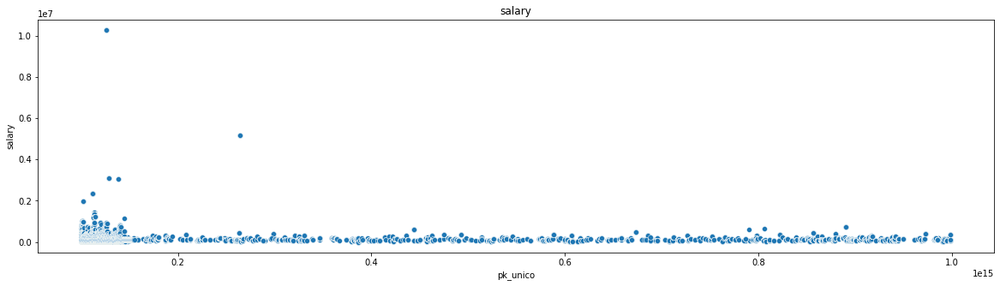

In [ ]:
col = 'salary'
plt.figure(figsize = (20,5))
plt.title(col)
sns.scatterplot(data=df_target,y=col,x='pk_unico')

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


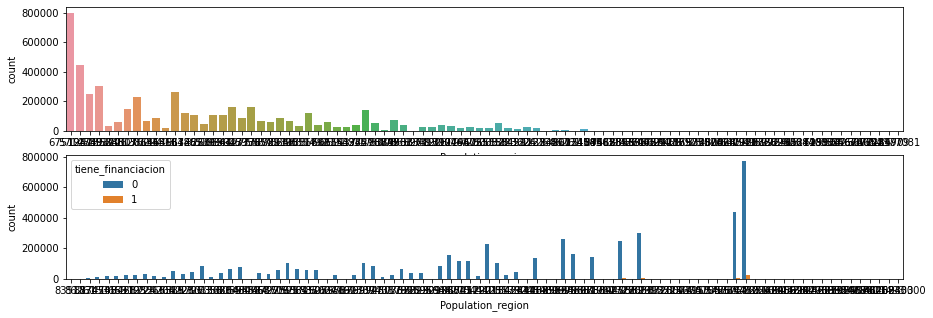

In [ ]:
plot_cat_values(df,'Population_region')

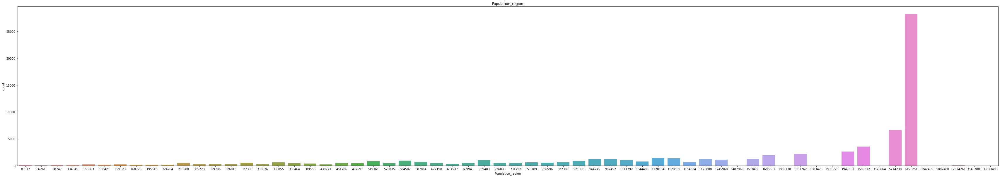

In [ ]:
col = 'Population_region'
plt.figure(figsize = (60,10))
plt.title(col)
sns.countplot(data=df_target,x=col)

In [ ]:
df_target['Population_region'].mode()

0    6751251
dtype: int64

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


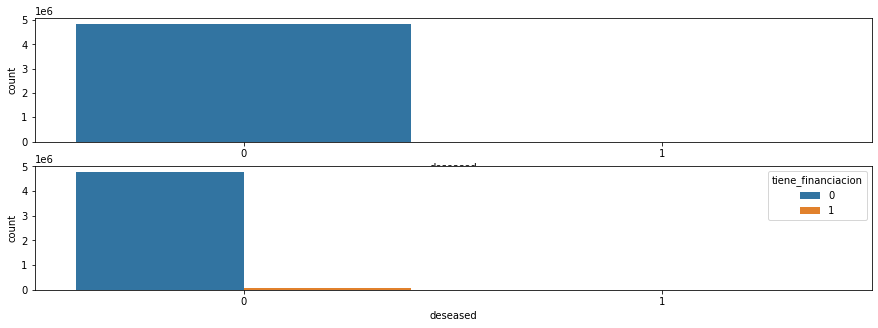

In [ ]:
plot_cat_values(df,'deseased')

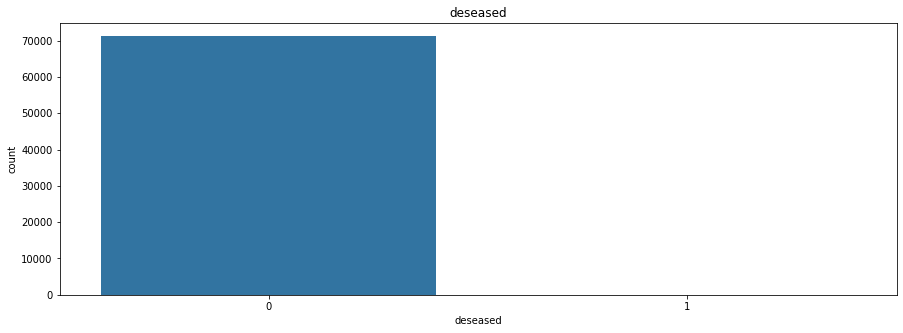

In [ ]:
col = 'deseased'
plt.figure(figsize = (15,5))
plt.title(col)
sns.countplot(data=df_target,x=col)

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


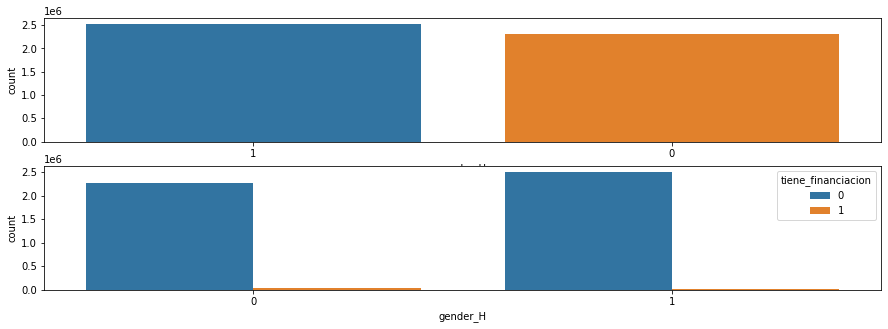

In [ ]:
plot_cat_values(df,'gender_H')

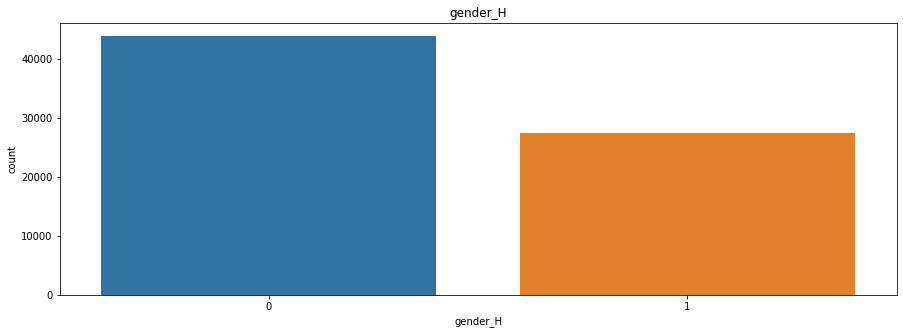

In [ ]:
col = 'gender_H'
plt.figure(figsize = (15,5))
plt.title(col)
sns.countplot(data=df_target,x=col)

In [ ]:
df['entry_channel'].nunique()

59

#Generamos OHE

In [ ]:
lista_categoricas_nom = ['segment','entry_channel']

In [ ]:
def OHE(dataframe, col_name):
  _dummy_dataset = pd.get_dummies(dataframe[col_name], prefix = col_name)
  dataframe = pd.concat([dataframe,_dummy_dataset], axis = 1)
  return dataframe.drop([col_name], axis =1)

In [ ]:
for i in lista_categoricas_nom:
  num_etiquetas = len(df[i].value_counts())
  print(num_etiquetas)
  print(i)
  df = OHE(df, i)

3
segment
59
entry_channel


In [ ]:
df

,active_customer,age,salary,Population_region,deseased,gender_H,tiene_financiacion,client_since,Season,Year,...,entry_channel_KHE,entry_channel_KHF,entry_channel_KHK,entry_channel_KHL,entry_channel_KHM,entry_channel_KHN,entry_channel_KHO,entry_channel_KHP,entry_channel_KHQ,entry_channel_RED
pk_unico,,,,,,,,,,,,,,,,,,,,,
158910020180728,1.0,59,88654.65,6751251,0,1,0,304,3,2018,...,0,0,0,0,0,0,0,0,0,0
162030020190128,1.0,70,88654.65,5714730,0,0,0,156,1,2019,...,0,0,0,0,0,0,0,0,0,0
162030020190228,1.0,70,88654.65,5714730,0,0,0,156,1,2019,...,0,0,0,0,0,0,0,0,0,0
162030020190328,1.0,70,88654.65,5714730,0,0,0,156,1,2019,...,0,0,0,0,0,0,0,0,0,0
162030020190428,1.0,70,88654.65,5714730,0,0,0,156,2,2019,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
155345620190528,1.0,32,88654.65,6751251,0,1,0,0,2,2019,...,1,0,0,0,0,0,0,0,0,0
155354120190528,1.0,54,88654.65,168725,0,0,0,0,2,2019,...,1,0,0,0,0,0,0,0,0,0
155355920190528,1.0,43,88654.65,5714730,0,1,0,0,2,2019,...,1,0,0,0,0,0,0,0,0,0


In [ ]:
df.columns

Index(['active_customer', 'age', 'salary', 'Population_region', 'deseased',
       'gender_H', 'tiene_financiacion', 'client_since', 'Season', 'Year',
       'Month', 'Week', 'Weekday', 'segment_01 - TOP',
       'segment_02 - PARTICULARES', 'segment_03 - UNIVERSITARIO',
       'entry_channel_004', 'entry_channel_007', 'entry_channel_013',
       'entry_channel_KAA', 'entry_channel_KAB', 'entry_channel_KAD',
       'entry_channel_KAE', 'entry_channel_KAF', 'entry_channel_KAG',
       'entry_channel_KAH', 'entry_channel_KAJ', 'entry_channel_KAK',
       'entry_channel_KAM', 'entry_channel_KAQ', 'entry_channel_KAR',
       'entry_channel_KAS', 'entry_channel_KAT', 'entry_channel_KAW',
       'entry_channel_KAY', 'entry_channel_KAZ', 'entry_channel_KBE',
       'entry_channel_KBG', 'entry_channel_KBH', 'entry_channel_KBO',
       'entry_channel_KBW', 'entry_channel_KBZ', 'entry_channel_KCB',
       'entry_channel_KCC', 'entry_channel_KCH', 'entry_channel_KCI',
       'entry_channel_KCK', 

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 4841417 entries, 158910020180728 to 155357120190528
Data columns (total 75 columns):
 #   Column                      Dtype   
---  ------                      -----   
 0   active_customer             category
 1   age                         uint8   
 2   salary                      float64 
 3   Population_region           int64   
 4   deseased                    category
 5   gender_H                    category
 6   tiene_financiacion          int64   
 7   client_since                int64   
 8   Season                      int64   
 9   Year                        int64   
 10  Month                       int64   
 11  Week                        int64   
 12  Weekday                     int64   
 13  segment_01 - TOP            uint8   
 14  segment_02 - PARTICULARES   uint8   
 15  segment_03 - UNIVERSITARIO  uint8   
 16  entry_channel_004           uint8   
 17  entry_channel_007           uint8   
 18  entry_channel_013   

In [ ]:
df.pivot_table(index=['Year','Month'], values='tiene_financiacion', aggfunc=[len, sum, np.mean])

len                sum               mean
           tiene_financiacion tiene_financiacion tiene_financiacion
Year Month                                                         
2018 1                 235070               3342           0.014217
     2                 238022               3301           0.013868
     3                 240738               3536           0.014688
     4                 242917               3751           0.015441
     5                 245395               3825           0.015587
     6                 247399               4030           0.016289
     7                 258830               4168           0.016103
     8                 271784               4234           0.015579
     9                 288105               4316           0.014981
     10                305425               4415           0.014455
     11                314293               4540           0.014445
     12                318036               4561           0.014341
2019 1                 321964               4518           0.014033
     2                 324558               4566           0.014068
     3                 327686               4601           0.014041
     4                 329607               4778           0.014496
     5                 331588               4831           0.014569

###Hacemos el split de la validacion y el train 

In [ ]:
dev_df = df[(df['Year'] == 2018)] # development = train + test
val_df = df[(df['Year'] == 2019) & (df['Month'] >= 1)] # validation

In [ ]:
df.shape

(4841417, 75)

In [ ]:
dev_df.shape

(3206014, 75)

In [ ]:
val_df.shape

(1635403, 75)

In [ ]:
!conda install python-graphviz -y

/bin/bash: conda: command not found


In [ ]:
!conda install pydot -y

/bin/bash: conda: command not found


In [ ]:
dev_df_X = dev_df.drop('tiene_financiacion', axis=1)
dev_df_y = dev_df[['tiene_financiacion']]

In [ ]:
val_df_X = val_df.drop('tiene_financiacion', axis=1)
val_df_y = val_df[['tiene_financiacion']]

In [ ]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.tree import export_graphviz
import graphviz
from sklearn import model_selection # model assesment and model selection strategies
from sklearn import metrics # model evaluation metrics

In [ ]:
dt = DecisionTreeClassifier(
                        # criterion='gini',
                        # splitter='best',
                        max_depth=4, # Importante, regulará el sobreajuste
                        # min_samples_split=2,
                        # min_samples_leaf=1,
                        # min_weight_fraction_leaf=0.0,
                        # max_features=None,
                        random_state=42,
                        # max_leaf_nodes=None,
                        # min_impurity_decrease=0.0,
                        # min_impurity_split=None,
                        # class_weight=None,
                        # presort=False,  
                )

In [ ]:
X_train, X_test, y_train, y_test = model_selection.train_test_split(
                                        dev_df_X, # X 
                                        dev_df_y, # y
                                        test_size = 0.30, # tamaño del split aleatorio 
                                        random_state = 42
                                     )

In [ ]:
dt.fit(
    X=X_train, 
    y=y_train, 
    # sample_weight=None, 
    # check_input=True, 
    # X_idx_sorted=None
)

DecisionTreeClassifier(max_depth=4, random_state=42)

In [ ]:
dot_data = export_graphviz(
                        decision_tree = dt,
                        out_file=None,
                        # max_depth=None,
                        feature_names=X_test.columns,
                        class_names=['Sin prod financiacion', 'Con prod financiacion'],
                        # label='all',
                        filled=True,
                        # leaves_parallel=False,
                        impurity=True,
                        # node_ids=False,
                        proportion=True,
                        rotate=False,
                        rounded=True,
                        # special_characters=False,
                        precision=4,
                        )

In [ ]:
import pydotplus
graph2 = pydotplus.graph_from_dot_data(dot_data)

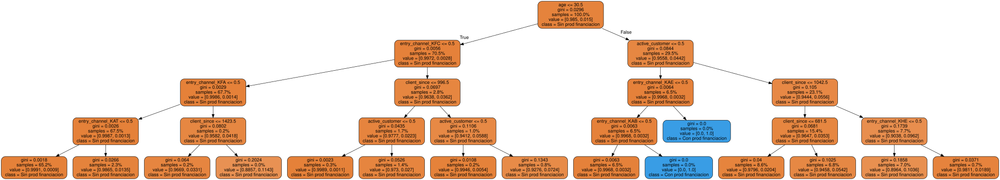

In [ ]:
graphviz.Source(dot_data, format = 'png')

Rebalanceo del DF

In [ ]:
#undersamplig
df_dev_nonzero = dev_df[dev_df['tiene_financiacion']> 0 ] #se queda igual
df_dev_zero = dev_df[dev_df['tiene_financiacion']== 0 ] # vamos a coger valores random

In [ ]:
n_zeros = len(df_dev_nonzero)*4

In [ ]:
df_dev_zero_sample = df_dev_zero.sample(n =n_zeros, random_state= 42 )

In [ ]:
df_dev_zero_sample.shape

(192076, 75)

In [ ]:
df_dev_sample=pd.concat([df_dev_zero_sample,df_dev_nonzero])

Lanzamos nuevamente el modelo con el resample

In [ ]:
dev_df_X = df_dev_sample.drop('tiene_financiacion', axis=1)
dev_df_y = df_dev_sample[['tiene_financiacion']]

In [ ]:
X_train_r, X_test_r, y_train_r, y_test_r = model_selection.train_test_split(
                                        dev_df_X, # X 
                                        dev_df_y, # y
                                        test_size = 0.30, # tamaño del split aleatorio 
                                        random_state = 42
                                     )

In [ ]:
dt_reduce = DecisionTreeClassifier(
                        # criterion='gini',
                        # splitter='best',
                        max_depth=4, # Importante, regulará el sobreajuste
                        # min_samples_split=2,
                        # min_samples_leaf=1,
                        # min_weight_fraction_leaf=0.0,
                        # max_features=None,
                        random_state=42,
                        # max_leaf_nodes=None,
                        # min_impurity_decrease=0.0,
                        # min_impurity_split=None,
                        # class_weight=None,
                        # presort=False,  
                )

In [ ]:
dt_reduce.fit(
    X=X_train_r, 
    y=y_train_r, 
    # sample_weight=None, 
    # check_input=True, 
    # X_idx_sorted=None
)

DecisionTreeClassifier(max_depth=4, random_state=42)

In [ ]:
dot_data_reduce = export_graphviz(
                        decision_tree = dt_reduce,
                        out_file=None,
                        # max_depth=None,
                        feature_names=X_test_r.columns,
                        class_names=['Sin prod financiacion', 'Con prod financiacion'],
                        # label='all',
                        filled=True,
                        # leaves_parallel=False,
                        impurity=True,
                        # node_ids=False,
                        proportion=True,
                        rotate=False,
                        rounded=True,
                        # special_characters=False,
                        precision=4,
                        )

In [ ]:
graphviz.Source(dot_data_reduce, format = 'png')

In [ ]:
#Aca deberiamos usar datos de usuarios unicos y los ultimos registros de fecha

In [ ]:
#dev_df_X.index

In [ ]:
#X_ultima_particion= dev_df_X[['20190428' in str(s) for s in dev_df_X.index]]

In [ ]:
#sum(['20190428' in str(s) for s in dev_df_X.index])

In [ ]:
#X_ultima_particion

In [ ]:
y_test_pred_r = pd.DataFrame(dt.predict(X_test_r), index=y_test_r.index, columns=['Tiene_finan_pred'])

In [ ]:
y_test_r.shape

(72029, 1)

In [ ]:
y_test_pred_r.shape

(72029, 1)

In [ ]:
results_df_reduce = y_test_r.join(y_test_pred_r, how= 'inner')

In [ ]:
results_df_reduce['Success'] = (results_df_reduce['tiene_financiacion'] == results_df_reduce['Tiene_finan_pred']).astype(int)

In [ ]:
results_df_reduce.head(20)

,tiene_financiacion,Tiene_finan_pred,Success
pk_unico,,,
129796520180128,0,0,1
142484820181228,0,0,1
110471320181028,1,0,0
105891420181028,0,0,1
106636520180628,0,0,1
117900420180128,0,0,1
138963920180328,0,0,1
109254820180128,1,0,0
106732420181128,0,0,1


In [ ]:
#results_df_reduce['Success'].count()

In [ ]:
#results_df_reduce['Success'].sum()

In [ ]:
#results_df_reduce['Success'].mean()

In [ ]:
#print('Hemos acertado {} registros de un total de {}, por tanto el Accuracy es {}.'.format(results_df_reduce['Success'].sum(), results_df_reduce['Success'].count(), results_df_reduce['Success'].mean()))

Validamos por mes

In [ ]:
dt.score(X_test_r, y_test_r)

0.7997473239945022

In [ ]:
results_df_reduce.head().T

pk_unico,129796520180128,142484820181228,110471320181028,105891420181028,106636520180628
tiene_financiacion,0,0,1,0,0
Tiene_finan_pred,0,0,0,0,0
Success,1,1,0,1,1


In [ ]:
# INTENTAR TENER EL SUCCESS POR MES Y AÑO
#results_df_reduce['Year'] = X_test_r['Year']

In [ ]:
#results_df_reduce.pivot_table(index=['Year', 'Month'], values='Success', aggfunc=[len, sum, np.mean])

In [ ]:
#results_df['Month'] = X_test['Month']

In [ ]:
#results_df.head()

In [ ]:
#results_df.pivot_table(index=['Year', 'Month'], values='Success', aggfunc=[len, sum, np.mean])

Evaluamos modelo de manera probabilistica -> ver que clientes tienen mas chances de contratar un nuevo producto

In [ ]:
y_score = pd.DataFrame(dt.predict_proba(X_test_r)[:,1], index=y_test_r.index, columns=['ProbConFinanciacion'])

In [ ]:
results_df_reduce = results_df_reduce.join(y_score)

In [ ]:
results_df_reduce.head(10)

,tiene_financiacion,Tiene_finan_pred,Success,ProbConFinanciacion
pk_unico,,,,
129796520180128,0,0,1,0.020394
142484820181228,0,0,1,0.000885
110471320181028,1,0,0,0.103612
105891420181028,0,0,1,0.000885
106636520180628,0,0,1,0.013501
117900420180128,0,0,1,0.000885
138963920180328,0,0,1,0.000885
109254820180128,1,0,0,0.072397
106732420181128,0,0,1,0.003153


###Nos traemos los diez mil clientes

In [ ]:
# CREAMOS DF PARA EL SIGUIENTE KMEANS
df_kmeans2 = results_df_reduce.sort_values('ProbConFinanciacion',ascending=False)

In [ ]:
df_kmeans2['pk_cid']= df_kmeans2.index.astype('str').str[:7]

In [ ]:
df_kmeans2['pk_partition']=df_kmeans2.index.astype('str').str[-8:]

In [ ]:
df_kmeans2['pk_partition']

pk_unico
422832020180328    20180328
879866020180428    20180428
422832020180428    20180428
101209820180228    20180228
101838020180828    20180828
                     ...   
109867820180728    20180728
102411320181128    20181128
135352820180828    20180828
104822820181128    20181128
119288520181028    20181028
Name: pk_partition, Length: 72029, dtype: object

In [ ]:
df_kmeans2.sort_values(['pk_cid','pk_partition'],axis=0,ascending=False, inplace=True)

In [ ]:
df_kmeans2[df_kmeans2.duplicated('pk_cid', keep='first')]

,tiene_financiacion,Tiene_finan_pred,Success,ProbConFinanciacion,pk_cid,pk_partition
pk_unico,,,,,,
998330020180828,1,0,0,0.103612,9983300,20180828
998330020180628,1,0,0,0.103612,9983300,20180628
998330020180328,1,0,0,0.103612,9983300,20180328
998330020180128,1,0,0,0.103612,9983300,20180128
998250020180228,1,0,0,0.103612,9982500,20180228
...,...,...,...,...,...,...
100042320180928,1,0,0,0.103612,1000423,20180928
100042320180628,1,0,0,0.103612,1000423,20180628
100042320180528,1,0,0,0.103612,1000423,20180528


In [ ]:
df_kmeans2.shape

(72029, 6)

In [ ]:
df_kmeans2.drop_duplicates('pk_cid', keep='first', inplace=True)

In [ ]:
df_kmeans2.sort_values('ProbConFinanciacion',axis=0,ascending=False)

,tiene_financiacion,Tiene_finan_pred,Success,ProbConFinanciacion,pk_cid,pk_partition
pk_unico,,,,,,
879866020180428,1,1,1,1.000000,8798660,20180428
101594020180828,1,0,0,0.114286,1015940,20180828
101513820181228,0,0,1,0.114286,1015138,20181228
101838020181028,1,0,0,0.114286,1018380,20181028
100875920180428,0,0,1,0.114286,1008759,20180428
...,...,...,...,...,...,...
118167220180928,0,0,1,0.000885,1181672,20180928
118166820180928,0,0,1,0.000885,1181668,20180928
118166020180528,0,0,1,0.000885,1181660,20180528


In [ ]:
df_kmeans2_final = df_kmeans2.head(10000)

In [ ]:
df_kmeans2_final

,tiene_financiacion,Tiene_finan_pred,Success,ProbConFinanciacion,pk_cid,pk_partition
pk_unico,,,,,,
999892020180828,0,0,1,0.054193,9998920,20180828
999825020180928,0,0,1,0.054193,9998250,20180928
998771020180528,1,0,0,0.103612,9987710,20180528
998330020181228,1,0,0,0.103612,9983300,20181228
998250020180528,1,0,0,0.103612,9982500,20180528
...,...,...,...,...,...,...
135454620181028,0,0,1,0.000885,1354546,20181028
135454520181228,0,0,1,0.000885,1354545,20181228
135451920180128,0,0,1,0.000885,1354519,20180128


In [ ]:
df_kmeans2_final.to_pickle(ruta + '/' + r'df_kmeans2', compression='infer', protocol=4, storage_options=None)

In [ ]:
results_df_reduce.pivot_table(index='ProbConFinanciacion', values='Success', aggfunc=[len, sum, np.mean])

,len,sum,mean
,Success,Success,Success
ProbConFinanciacion,,,
0.000885,38668,38089,0.985026
0.001135,175,168,0.960000
0.003153,3948,3745,0.948582
0.005426,152,146,0.960526
0.013501,1579,1306,0.827106
0.018933,528,398,0.753788
0.020394,6490,4796,0.738983
0.027034,1117,775,0.693823


### Validacion del modelo

In [ ]:
# Vemos que el modelo comienza a overfittear a medida que gana profundidad, a partir de la 14/15
for i in range(1, 20):
    dt_reduce = DecisionTreeClassifier(max_depth=i, random_state=42)
    dt_reduce.fit(X_train_r, y_train_r)
    train_accuracy = dt_reduce.score(X_train_r, y_train_r)
    test_accuracy = dt_reduce.score(X_test_r, y_test_r)
    print('Profundidad del árbol: {}. Train: {} - Test: {}'.format(i, train_accuracy, test_accuracy))

Profundidad del árbol: 1. Train: 0.8001261409208287 - Test: 0.7997056741034861
Profundidad del árbol: 2. Train: 0.8001261409208287 - Test: 0.7997056741034861
Profundidad del árbol: 3. Train: 0.841246891102305 - Test: 0.8380096905413098
Profundidad del árbol: 4. Train: 0.8499280044744326 - Test: 0.8463119021505227
Profundidad del árbol: 5. Train: 0.8518082181999929 - Test: 0.8481028474642158
Profundidad del árbol: 6. Train: 0.8548308402651339 - Test: 0.8505185411431507
Profundidad del árbol: 7. Train: 0.8580974141111231 - Test: 0.8530036513071124
Profundidad del árbol: 8. Train: 0.8605488320064737 - Test: 0.8545863471657249
Profundidad del árbol: 9. Train: 0.8632799019432842 - Test: 0.8566827250135363
Profundidad del árbol: 10. Train: 0.866897528351957 - Test: 0.8607782976301211
Profundidad del árbol: 11. Train: 0.8719610153154118 - Test: 0.8624304099737605
Profundidad del árbol: 12. Train: 0.8768103007151952 - Test: 0.8656652181760124
Profundidad del árbol: 13. Train: 0.882212940154463

Creamos un nuevo DT con los parametros mas optimos

In [ ]:
# conviene cambiar los parametros con la funcion que arroja los parametros optimos?

dt_optimo = DecisionTreeClassifier(max_depth=13, random_state=42)
dt_optimo.fit(X_train_r, y_train_r)

DecisionTreeClassifier(max_depth=13, random_state=42)

In [ ]:
dt_optimo.score(X_train_r, y_train_r)

0.8822129401544632

In [ ]:
dt_optimo.score(X_test_r, y_test_r)

0.8695108914465007

In [ ]:
# Por que nos da tan bien?

dt_optimo.score(val_df_X, val_df_y)

0.908247080383245

In [ ]:
dot_data_optimo = export_graphviz(
                        decision_tree = dt_optimo,
                        out_file=None,
                        # max_depth=None,
                        feature_names=X_test_r.columns,
                        class_names=['Sin prod financiacion', 'Con prod financiacion'],
                        # label='all',
                        filled=True,
                        # leaves_parallel=False,
                        impurity=True,
                        # node_ids=False,
                        proportion=True,
                        rotate=True,
                        rounded=True,
                        # special_characters=False,
                        precision=4,
                        )

In [ ]:
import pydotplus

In [ ]:
from sklearn import tree


In [ ]:
#dot_data_optimo

'digraph Tree {\nnode [shape=box, style="filled, rounded", color="black", fontname="helvetica"] ;\nedge [fontname="helvetica"] ;\nrankdir=LR ;\n0 [label="age <= 29.5\\ngini = 0.3198\\nsamples = 100.0%\\nvalue = [0.8001, 0.1999]\\nclass = Sin prod financiacion", fillcolor="#eba06a"] ;\n1 [label="entry_channel_KFC <= 0.5\\ngini = 0.069\\nsamples = 57.4%\\nvalue = [0.9642, 0.0358]\\nclass = Sin prod financiacion", fillcolor="#e68640"] ;\n0 -> 1 [labeldistance=2.5, labelangle=-45, headlabel="True"] ;\n2 [label="entry_channel_KAT <= 0.5\\ngini = 0.0383\\nsamples = 54.7%\\nvalue = [0.9805, 0.0195]\\nclass = Sin prod financiacion", fillcolor="#e6843d"] ;\n1 -> 2 ;\n3 [label="entry_channel_KFA <= 0.5\\ngini = 0.0277\\nsamples = 52.7%\\nvalue = [0.986, 0.014]\\nclass = Sin prod financiacion", fillcolor="#e5833c"] ;\n2 -> 3 ;\n4 [label="entry_channel_RED <= 0.5\\ngini = 0.0247\\nsamples = 52.5%\\nvalue = [0.9875, 0.0125]\\nclass = Sin prod financiacion", fillcolor="#e5833c"] ;\n3 -> 4 ;\n5 [labe

In [ ]:
#tree.export_text(dt_optimo)

'|--- feature_1 <= 29.50\n|   |--- feature_54 <= 0.50\n|   |   |--- feature_31 <= 0.50\n|   |   |   |--- feature_53 <= 0.50\n|   |   |   |   |--- feature_73 <= 0.50\n|   |   |   |   |   |--- feature_0 <= 0.50\n|   |   |   |   |   |   |--- feature_66 <= 0.50\n|   |   |   |   |   |   |   |--- feature_6 <= 1340.50\n|   |   |   |   |   |   |   |   |--- class: 0\n|   |   |   |   |   |   |   |--- feature_6 >  1340.50\n|   |   |   |   |   |   |   |   |--- feature_6 <= 1341.50\n|   |   |   |   |   |   |   |   |   |--- feature_3 <= 689673.00\n|   |   |   |   |   |   |   |   |   |   |--- feature_3 <= 665740.00\n|   |   |   |   |   |   |   |   |   |   |   |--- class: 0\n|   |   |   |   |   |   |   |   |   |   |--- feature_3 >  665740.00\n|   |   |   |   |   |   |   |   |   |   |   |--- truncated branch of depth 3\n|   |   |   |   |   |   |   |   |   |--- feature_3 >  689673.00\n|   |   |   |   |   |   |   |   |   |   |--- class: 0\n|   |   |   |   |   |   |   |   |--- feature_6 >  1341.50\n|   | 

In [ ]:
#text_representation = tree.export_text(dt_optimo)
#print(text_representation)

In [ ]:
#from sklearn.externals.six import StringIO

In [ ]:
#graph = pydotplus.graph_from_dot_data(dot_data_optimo.getvalue())  
#graph.write_png('my_decision_tree.png')

In [ ]:
graphviz.Source(dot_data_optimo, format = 'png')

In [ ]:
fig= graphviz.Source(dot_data_optimo, format = 'png')

In [ ]:
fig.savefig("dot_data_optimo.png")


In [ ]:
my_graph= graphviz.Source(dot_data_optimo, format = 'png')

In [ ]:
my_graph.render('decision_tree',format='png', view=False)

dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.355171 to fit


'decision_tree.png'

In [ ]:
#observamos los mejores parámetros
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import classification_report
cv = 2
def optimizar_params(clf, tuned_parameters, scores, cv):
    for score in scores:
        print("# Tuning hyper-parameters for %s" % score)
        print()
        clf = GridSearchCV(
            clf, tuned_parameters, scoring=score, cv=cv
        )
        clf.fit(X_train_r, y_train_r)
        print("Best parameters set found on development set:")
        print()
        print(clf.best_params_)
        print()
        print("Grid scores on development set:")
        print()
        means = clf.cv_results_['mean_test_score']
        stds = clf.cv_results_['std_test_score']
        for mean, std, params in zip(means, stds, clf.cv_results_['params']):
            print("%0.3f (+/-%0.03f) for %r"
                  % (mean, std * 2, params))
        print()
        print("Detailed classification report:")
        print()
        print("The model is trained on the full development set.")
        print("The scores are computed on the full evaluation set.")
        print()
        y_true, y_pred = y_test_r, clf.predict(X_test_r)
        print(classification_report(y_true, y_pred))
        print()
        #confusion matrix
        print('Confusion Matrix:')
        from sklearn.metrics import confusion_matrix
        cm = confusion_matrix(y_true, y_pred, labels=[1, 0])
        print(cm)
        return clf.best_params_

In [ ]:
tuned_parameters = [{
                      "criterion": ["gini"],
                      "max_depth": [13, 14, 15], #cantidad de preguntas que permitimos
                      "min_samples_split": [0.10, 0.05, 0.005], #cantidad minima de obs en corte
                      "random_state": [42],
                     }]
scores = ["accuracy"]
clf = DecisionTreeClassifier()
optimizar_params(clf, tuned_parameters, scores, cv)

##Evaluacion del modelo

###Curva AUG

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.datasets import make_classification
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import roc_curve
from sklearn.metrics import roc_auc_score 

In [ ]:
def plot_roc_curve(fpr, tpr):
    plt.plot(fpr, tpr, color='red', label='ROC')
    plt.plot([0, 1], [0, 1], color='green', linestyle='--')
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rat')

In [ ]:
fpr, tpr, thresholds = roc_curve(y_test_r, y_score)

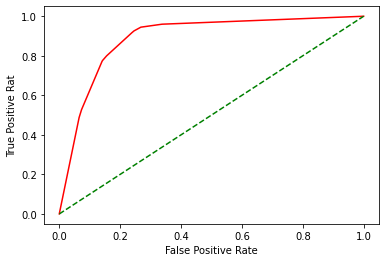

In [ ]:
plot_roc_curve(fpr, tpr)

In [ ]:
roc_auc_score(y_test_r, y_score)

0.8896057772835538

In [ ]:
val_predictions = pd.DataFrame(dt_reduce.predict(val_df_X), index=val_df_X.index, columns=['Prediction'])
val_results_df = val_df_y.join(val_predictions)

In [ ]:
val_results_df.head()

,tiene_financiacion,Prediction
pk_unico,,
100002820190128,0,0
100002820190228,0,0
100002820190328,0,0
100002820190428,0,0
100002820190528,0,0


In [ ]:
y_val_score = pd.DataFrame(dt.predict_proba(val_df_X)[:,1], index=val_df_y.index, columns=['ProbConFinanciacion'])

In [ ]:
results_df_val_reduce = val_results_df.join(y_val_score)

In [ ]:
results_df_val_reduce.head()

,tiene_financiacion,Prediction,ProbConFinanciacion
pk_unico,,,
100002820190128,0,0,0.054193
100002820190228,0,0,0.054193
100002820190328,0,0,0.054193
100002820190428,0,0,0.054193
100002820190528,0,0,0.054193


In [ ]:
fpr, tpr, thresholds = roc_curve(val_df_y, y_val_score)

In [ ]:
roc_auc_score(val_df_y, y_val_score)

0.8807393935792818

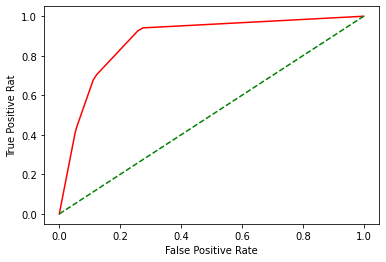

In [ ]:
plot_roc_curve(fpr, tpr)

In [ ]:
# CREAMOS DF PARA EL SIGUIENTE KMEANS
df_kmeans2_last = results_df_val_reduce.sort_values('ProbConFinanciacion',ascending=False)

In [ ]:
df_kmeans2_last.head()

,tiene_financiacion,Prediction,ProbConFinanciacion
pk_unico,,,
101108320190528,0,0,0.114286
101007320190228,0,0,0.114286
101838020190528,1,1,0.114286
101838020190428,1,1,0.114286
101838020190328,1,1,0.114286


In [ ]:
df_kmeans2_last['pk_cid']= df_kmeans2_last.index.astype('str').str[:7]

In [ ]:
df_kmeans2_last['pk_partition']=df_kmeans2_last.index.astype('str').str[-8:]

In [ ]:
df_kmeans2_last['pk_partition']

pk_unico
101108320190528    20190528
101007320190228    20190228
101838020190528    20190528
101838020190428    20190428
101838020190328    20190328
                     ...   
122215920190128    20190128
103767020190428    20190428
122215620190528    20190528
122215620190428    20190428
127047520190428    20190428
Name: pk_partition, Length: 1638361, dtype: object

In [ ]:
df_kmeans2_last.sort_values(['pk_cid','pk_partition'],axis=0,ascending=False, inplace=True)

In [ ]:
df_kmeans2_last[df_kmeans2_last.duplicated('pk_cid', keep='first')]

,tiene_financiacion,Prediction,ProbConFinanciacion,pk_cid,pk_partition
pk_unico,,,,,
999892020190428,0,0,0.054193,9998920,20190428
999892020190328,0,0,0.054193,9998920,20190328
999892020190228,0,0,0.054193,9998920,20190228
999892020190128,0,0,0.054193,9998920,20190128
999835020190428,0,1,0.103612,9998350,20190428
...,...,...,...,...,...
100015720190128,0,1,0.103612,1000157,20190128
100002820190428,0,0,0.054193,1000028,20190428
100002820190328,0,0,0.054193,1000028,20190328


In [ ]:
df_kmeans2_last.shape

(1638361, 5)

In [ ]:
df_kmeans2_last.drop_duplicates('pk_cid', keep='first', inplace=True)

In [ ]:
df_kmeans2_last = df_kmeans2_last.sort_values('ProbConFinanciacion',axis=0,ascending=False)

In [ ]:
df_kmeans2_last.head(10000)

,tiene_financiacion,Prediction,ProbConFinanciacion,pk_cid,pk_partition
pk_unico,,,,,
101603120190528,0,0,0.114286,1016031,20190528
101738020190528,1,1,0.114286,1017380,20190528
101512220190528,0,1,0.114286,1015122,20190528
101142720190528,0,1,0.114286,1011427,20190528
100373620190528,0,0,0.114286,1003736,20190528
...,...,...,...,...,...
112792220190528,0,1,0.103612,1127922,20190528
112795620190528,0,1,0.103612,1127956,20190528
112798220190528,0,0,0.103612,1127982,20190528


In [ ]:
df_kmeans2_last[df_kmeans2_last['pk_cid']==1530900]

,tiene_financiacion,Prediction,ProbConFinanciacion,pk_cid,pk_partition
pk_unico,,,,,


In [ ]:
df_kmeans2_last_10000 = df_kmeans2_last.head(10000)

In [ ]:
df_kmeans2_last_10000

,tiene_financiacion,Prediction,ProbConFinanciacion,pk_cid,pk_partition
pk_unico,,,,,
101603120190528,0,0,0.114286,1016031,20190528
101738020190528,1,1,0.114286,1017380,20190528
101512220190528,0,1,0.114286,1015122,20190528
101142720190528,0,1,0.114286,1011427,20190528
100373620190528,0,0,0.114286,1003736,20190528
...,...,...,...,...,...
112792220190528,0,1,0.103612,1127922,20190528
112795620190528,0,1,0.103612,1127956,20190528
112798220190528,0,0,0.103612,1127982,20190528


In [ ]:
df_kmeans2_last_10000.to_pickle(ruta + '/' + r'df_kmeans2_last_10000', compression='infer', protocol=4, storage_options=None)

##Etiquetar clientes por el producto a ofrecer

In [ ]:
#Tenemos que traer el ultimo mes y ver que producto de financiacion tienen y cual no, y venderles ese
#seria tener la columna de los productos por el ultimo mes

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
products_df = pd.read_csv( ruta + '/' + 'products_df.csv')